In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/yolov9-main

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/My Drive/yolov9-main


In [ ]:
import cv2
import numpy as np
instance_path = "datasets/PhenoBench/train/plant_instances/05-26_00193_P0034119.png"
semantic_path = "datasets/PhenoBench/train/semantics/05-26_00193_P0034119.png"

instance_mask = cv2.imread(instance_path, cv2.IMREAD_UNCHANGED)
semantic_mask = cv2.imread(semantic_path, cv2.IMREAD_UNCHANGED)

print("Instance mask shape:", instance_mask.shape, "Unique vals:", np.unique(instance_mask))
print("Semantic mask shape:", semantic_mask.shape, "Unique vals:", np.unique(semantic_mask))

if semantic_mask.ndim == 3:
    print("Semantic mask channels:", semantic_mask.shape[2])
    semantic_mask_gray = semantic_mask[:, :, 0]
    print("Unique vals in semantic_mask_gray:", np.unique(semantic_mask_gray))

Instance mask shape: (1024, 1024) Unique vals: [   0  229  235  236  237  238  315  335  336  337  338  342  517 1263
 1265]
Semantic mask shape: (1024, 1024) Unique vals: [0 1 2 3]


In [ ]:
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train | wc -l
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/train/labels | wc -l

1407
1407


In [ ]:
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val | wc -l
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/valid/labels | wc -l

772
772


In [ ]:
import os
import json
import cv2
import numpy as np
from glob import glob
from tqdm import tqdm

# === User config ===
output_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations"
os.makedirs(output_dir, exist_ok=True)

# Base image and label directories
image_dirs = {
    "train": "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train",
    "val":   "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
}
label_dirs = {
    "train": "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/train/labels",
    "val":   "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/valid/labels"
}

class_names = ["crop", "weed"]

def convert_to_coco(split):
    image_dir = image_dirs[split]
    label_dir = label_dirs[split]

    image_paths = sorted(glob(os.path.join(image_dir, "*.png")) + glob(os.path.join(image_dir, "*.jpg")))
    images = []
    annotations = []
    ann_id = 0

    for img_id, img_path in enumerate(tqdm(image_paths, desc=f"[{split}] Processing images")):
        filename = os.path.basename(img_path)
        name = os.path.splitext(filename)[0]
        label_path = os.path.join(label_dir, f"{name}.txt")

        img = cv2.imread(img_path)
        if img is None:
            print(f"⚠️ Image load failed: {img_path}")
            continue
        height, width = img.shape[:2]

        images.append({
            "id": img_id,
            "file_name": filename,
            "width": width,
            "height": height
        })

        if not os.path.exists(label_path):
            continue

        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            if len(parts) < 7:
                continue

            try:
                cls_id = int(parts[0])
                coords = list(map(float, parts[1:]))

                if len(coords) % 2 != 0:
                    continue

                coords_np = np.array(coords).reshape(-1, 2)
                coords_np = np.clip(coords_np, 0, 1)
                abs_coords = (coords_np * np.array([width, height])).astype(np.float32)
                abs_coords_flat = abs_coords.flatten().tolist()

                if len(abs_coords) < 3:
                    continue

                x_min, y_min = abs_coords.min(axis=0)
                x_max, y_max = abs_coords.max(axis=0)
                bbox = [float(x_min), float(y_min), float(x_max - x_min), float(y_max - y_min)]
                area = float((x_max - x_min) * (y_max - y_min))

                annotations.append({
                    "id": ann_id,
                    "image_id": img_id,
                    "category_id": cls_id,
                    "segmentation": [abs_coords_flat],
                    "area": area,
                    "bbox": bbox,
                    "iscrowd": 0
                })
                ann_id += 1
            except Exception as e:
                print(f"❌ Error in {label_path}: {e}")
                continue

    coco_dict = {
        "info": {
            "description": f"PhenoBench {split} in COCO instance format"
        },
        "licenses": [],
        "images": images,
        "annotations": annotations,
        "categories": [
            {"id": i, "name": name, "supercategory": "plant"} for i, name in enumerate(class_names)
        ]
    }

    out_json = os.path.join(output_dir, f"instances_{split}.json")
    with open(out_json, "w") as f:
        json.dump(coco_dict, f)
    print(f"✅ Saved: {out_json} — {len(images)} images, {len(annotations)} instances")

# Run for both splits
convert_to_coco("train")
convert_to_coco("val")

[train] Processing images: 100%|██████████| 1407/1407 [21:03<00:00,  1.11it/s]


✅ Saved: /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_train.json — 1407 images, 23253 instances


[val] Processing images: 100%|██████████| 772/772 [11:15<00:00,  1.14it/s]


✅ Saved: /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json — 772 images, 11874 instances


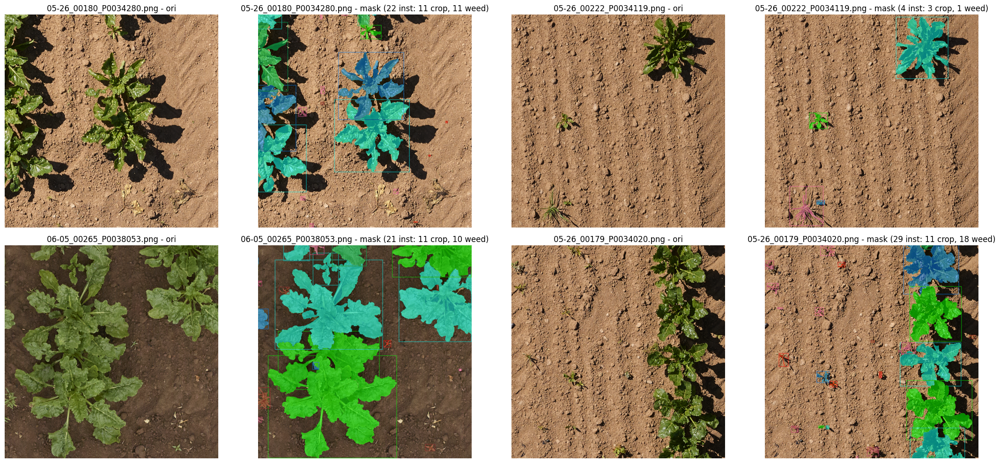

In [ ]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_train.json"

# --- Colors per class ---
CROP_COLORS = [(0, 255, 0), (0, 255, 255), (0, 128, 255), (0, 200, 100)]
WEED_COLORS = [(255, 0, 0), (255, 100, 180), (165, 42, 42), (200, 50, 120)]

def get_color(cls_id):
    return random.choice(CROP_COLORS if cls_id == 0 else WEED_COLORS)

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Pick random 4 images ---
random_img_ids = random.sample(list(image_id_map.keys()), 4)

fig, axes = plt.subplots(2, 4, figsize=(22, 10))

for i, img_id in enumerate(random_img_ids):
    filename = image_id_map[img_id]
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load: {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img.copy()
    h, w = img.shape[:2]

    anns = annotations_per_image.get(img_id, [])
    count_crop = 0
    count_weed = 0

    for ann in anns:
        cls_id = ann["category_id"]
        if cls_id == 0:
            count_crop += 1
        elif cls_id == 1:
            count_weed += 1

        seg = ann["segmentation"][0]
        coords = np.array(seg).reshape(-1, 2).astype(np.int32)
        if len(coords) < 3:
            continue

        color = get_color(cls_id)
        cv2.fillPoly(overlay, [coords], color)
        x_min, y_min = coords.min(axis=0)
        x_max, y_max = coords.max(axis=0)
        cv2.rectangle(overlay, (x_min, y_min), (x_max, y_max), color, 2)

    blended = cv2.addWeighted(img, 0.5, overlay, 0.5, 0)
    total = count_crop + count_weed

    row, col = i // 2, (i % 2) * 2
    axes[row, col].imshow(img)
    axes[row, col].set_title(f"{filename} - ori")
    axes[row, col].axis("off")

    axes[row, col + 1].imshow(blended)
    axes[row, col + 1].set_title(f"{filename} - mask ({total} inst: {count_crop} crop, {count_weed} weed)")
    axes[row, col + 1].axis("off")

plt.tight_layout()
plt.show()

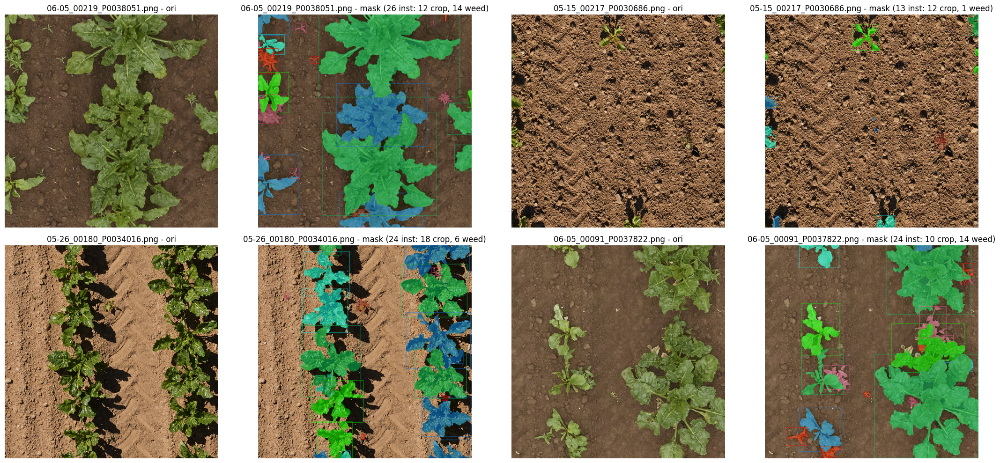

In [ ]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json"

# --- Colors per class ---
CROP_COLORS = [(0, 255, 0), (0, 255, 255), (0, 128, 255), (0, 200, 100)]
WEED_COLORS = [(255, 0, 0), (255, 100, 180), (165, 42, 42), (200, 50, 120)]

def get_color(cls_id):
    return random.choice(CROP_COLORS if cls_id == 0 else WEED_COLORS)

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Pick random 4 images ---
random_img_ids = random.sample(list(image_id_map.keys()), 4)

fig, axes = plt.subplots(2, 4, figsize=(22, 10))

for i, img_id in enumerate(random_img_ids):
    filename = image_id_map[img_id]
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load: {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img.copy()
    h, w = img.shape[:2]

    anns = annotations_per_image.get(img_id, [])
    count_crop = 0
    count_weed = 0

    for ann in anns:
        cls_id = ann["category_id"]
        if cls_id == 0:
            count_crop += 1
        elif cls_id == 1:
            count_weed += 1

        seg = ann["segmentation"][0]
        coords = np.array(seg).reshape(-1, 2).astype(np.int32)
        if len(coords) < 3:
            continue

        color = get_color(cls_id)
        cv2.fillPoly(overlay, [coords], color)
        x_min, y_min = coords.min(axis=0)
        x_max, y_max = coords.max(axis=0)
        cv2.rectangle(overlay, (x_min, y_min), (x_max, y_max), color, 2)

    blended = cv2.addWeighted(img, 0.5, overlay, 0.5, 0)
    total = count_crop + count_weed

    row, col = i // 2, (i % 2) * 2
    axes[row, col].imshow(img)
    axes[row, col].set_title(f"{filename} - ori")
    axes[row, col].axis("off")

    axes[row, col + 1].imshow(blended)
    axes[row, col + 1].set_title(f"{filename} - mask ({total} inst: {count_crop} crop, {count_weed} weed)")
    axes[row, col + 1].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# STEP 1: Install compatible PyTorch (2.0.1 + CUDA 11.7)
!pip install torch==2.0.1 torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

# STEP 2: Install OpenMMLab tools
!pip install -U openmim
!mim install "mmengine>=0.7.4"
!mim install "mmcv==2.1.0"

# STEP 3: Clone MMDetection & install
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

In [2]:
# STEP 4: Final check
!python -c "import torch; import mmcv; import mmdet; print('PyTorch:', torch.__version__); print('MMCV:', mmcv.__version__); print('MMDet:', mmdet.__version__)"

PyTorch: 2.0.1+cu117
MMCV: 2.1.0
MMDet: 3.3.0


In [ ]:
!pip install numpy==1.24.4

In [2]:
!ls mmdetection/configs/condinst/

condinst_pheno.py			       metafile.yml
condinst_r50_fpn_ms-poly-90k_coco_instance.py  README.md


In [ ]:
custom_cfg = """
_base_ = 'condinst_r50_fpn_ms-poly-90k_coco_instance.py'

# Custom classes
dataset_type = 'CocoDataset'
metainfo = dict(classes=('crop', 'weed'))
num_classes = 2

# Paths
data_root = '/content/gdrive/MyDrive/yolov9-main/datasets/'
train_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_train.json'
val_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_val.json'
train_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/train/'
val_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/val/'

# Normalization
img_norm_cfg = dict(mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)

# Pipelines
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(type='Resize', scale=(512, 512), keep_ratio=False),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(512, 512), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='Resize', scale=(512, 512), keep_ratio=False),
    dict(type='Pad', size=(512, 512), pad_val=dict(img=(114, 114, 114))),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(type='PackDetInputs', meta_keys=('img_id', 'img_path', 'ori_shape', 'img_shape', 'scale_factor'))
]

# Data loader
train_dataloader = dict(
    batch_size=32,
    num_workers=8,
    dataset=dict(
        type=dataset_type,
        data_root=data_root,
        ann_file=train_ann,
        data_prefix=dict(img=train_img),
        filter_cfg=dict(filter_empty_gt=True, min_size=32),
        pipeline=train_pipeline,
        metainfo=dict(classes=('crop', 'weed')),
    )
)

val_dataloader = dict(
    batch_size=16,
    num_workers=8,
    dataset=dict(
        type=dataset_type,
        data_root=data_root,
        ann_file=val_ann,
        data_prefix=dict(img=val_img),
        pipeline=test_pipeline,
        test_mode=True,
        metainfo=dict(classes=('crop', 'weed')),
    )
)

test_dataloader = val_dataloader

# Evaluator
#val_evaluator = dict(type='CocoMetric', ann_file=val_ann, metric=['bbox', 'segm'])
val_evaluator = dict(type='CocoMetric', ann_file=val_ann, metric=['bbox', 'segm'], classwise=True)
test_evaluator = val_evaluator

# Model
#model = dict(bbox_head=dict(num_classes=num_classes))
#model = dict(bbox_head=dict(num_classes=num_classes), test_cfg=dict(score_thr=0.5))

model = dict(
    type='CondInst',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=True,
        style='pytorch',
        init_cfg=dict(type='Pretrained', checkpoint='torchvision://resnet50')
    ),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5,
        add_extra_convs='on_output',
        relu_before_extra_convs=True,
        start_level=1,
    ),
    bbox_head=dict(
        type='CondInstBboxHead',
        num_classes=2,  # your class count here
        feat_channels=256,
        stacked_convs=4,
        strides=[8, 16, 32, 64, 128],
        loss_cls=dict(type='FocalLoss', use_sigmoid=True, gamma=2.0, alpha=0.25, loss_weight=1.0),
        loss_bbox=dict(type='GIoULoss', loss_weight=1.0),
        loss_centerness=dict(type='CrossEntropyLoss', use_sigmoid=True, loss_weight=1.0),
        center_sampling=True,
        centerness_on_reg=True,
        conv_bias=True,
    ),
    mask_head=dict(
        type='CondInstMaskHead',
        num_layers=3,
        feat_channels=8,
        mask_out_stride=4,
        size_of_interest=8,
        max_masks_to_train=300,
        loss_mask=dict(type='DiceLoss', use_sigmoid=True, loss_weight=1.0),
        mask_feature_head=dict(
            type='MaskFeatHead',
            in_channels=256,
            out_channels=8,
            num_stacked_convs=4,
            feat_channels=128,
            norm_cfg=dict(type='BN', requires_grad=True),
            start_level=0,
            end_level=2,
            mask_stride=8,
        ),
    ),
    train_cfg=dict(),
    test_cfg=dict(
        score_thr=0.3,
        nms=dict(type='nms', iou_threshold=0.6),
        max_per_img=100,
        mask_thr=0.3,
        min_bbox_size=0,
        nms_pre=100,
    )
)

# === Trainin
train_cfg = dict(
    type='IterBasedTrainLoop',
    max_iters=880,
    val_interval=44  # ← this controls when evaluation runs
)

val_cfg = dict(type='ValLoop')
test_cfg = dict(type='TestLoop')

# Optimizer
optim_wrapper = dict(
    optimizer=dict(type='SGD', lr=0.01, momentum=0.9, weight_decay=0.0001),
    clip_grad=None
)

# === Scheduler
param_scheduler = [
    dict(type='LinearLR', start_factor=0.1, by_epoch=False, begin=0, end=880),
    dict(type='MultiStepLR', begin=0, end=20, by_epoch=True, milestones=[15, 18], gamma=0.1)
]

# Logging and checkpointing
default_hooks = dict(
    checkpoint=dict(type='CheckpointHook', interval=88, by_epoch=False),
    logger=dict(type='LoggerHook', interval=88),
)

# Output path
work_dir = '/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet_outputs/condinst_crop_weed'

# Load pretrained COCO model
load_from = 'https://download.openmmlab.com/mmdetection/v3.0/condinst/condinst_r50_fpn_ms-poly-90k_coco_instance/condinst_r50_fpn_ms-poly-90k_coco_instance_20221129_125223-4c186406.pth'
"""

with open('mmdetection/configs/condinst/condinst_pheno.py', 'w') as f:
    f.write(custom_cfg)

In [ ]:
!python mmdetection/tools/train.py \
  mmdetection/configs/condinst/condinst_pheno.py --amp

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 08:43:13 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 949446534
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [ ]:
!python mmdetection/tools/test.py mmdetection/configs/condinst/condinst_pheno.py mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.pth

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 10:55:05 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1758010695
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA

In [ ]:
!python mmdetection/tools/test.py \
  mmdetection/configs/condinst/condinst_pheno.py \
  mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.pth \
  --show-dir pheno_seg_exp1

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 11:11:17 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 974614202
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [ ]:
import shutil
import os

src = "mmdetection/mmdet_outputs/condinst_crop_weed/20250719_111116/pheno_seg_exp1"
dst = "/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet_outputs/condinst_crop_weed/pheno_seg_condinst"

# First copy the folder and its contents
shutil.copytree(src, dst)

'/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet_outputs/condinst_crop_weed/pheno_seg_condinst'

In [ ]:
!ls mmdetection/mmdet_outputs/condinst_crop_weed/pheno_seg_condinst | wc -l

772


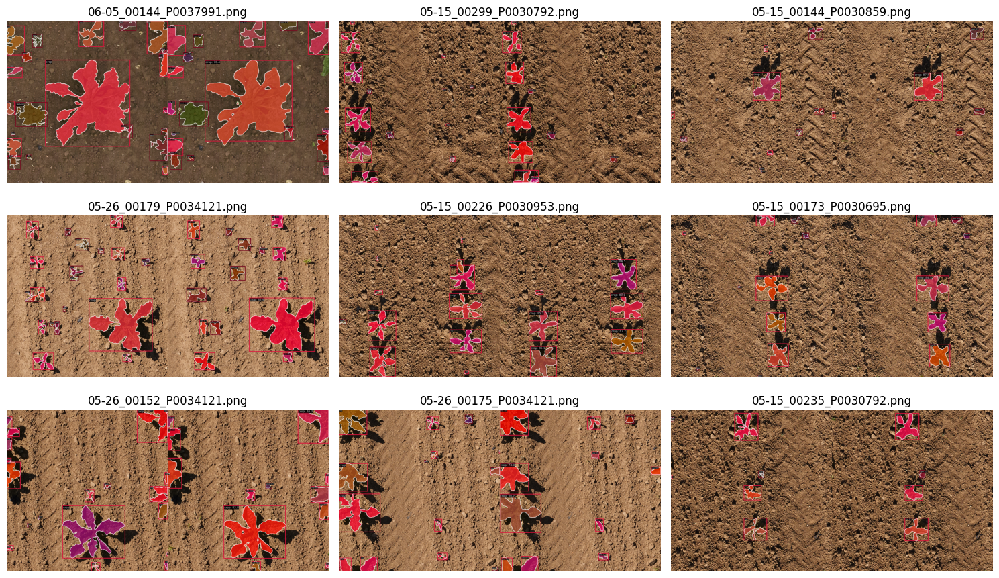

In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from glob import glob

# --- Config ---
results_dir = "mmdetection/mmdet_outputs/condinst_crop_weed/pheno_seg_condinst"
num_images = 9  # Any number

# --- Get image paths ---
image_paths = sorted(glob(os.path.join(results_dir, "*.png")))
sampled_paths = random.sample(image_paths, min(num_images, len(image_paths)))

# --- Plotting ---
cols = 3
rows = (len(sampled_paths) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 3))

# Flatten axes for easy indexing
axes = axes.flatten()

for i, img_path in enumerate(sampled_paths):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(img)
    axes[i].set_title(os.path.basename(img_path))
    axes[i].axis("off")

# Hide unused subplots if any
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

In [3]:
from mmdet.apis import init_detector, inference_detector
import mmcv

# Config and checkpoint paths
config_file = 'mmdetection/configs/condinst/condinst_pheno.py'
checkpoint_file = 'mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.pth'

# Initialize the model
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or 'cpu'

# Image path
img = '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png'

# Run inference
result = inference_detector(model, img)
print(result)

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117


Loads checkpoint by local backend from path: mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.pth
<DetDataSample(

    META INFORMATION
    img_shape: (512, 512)
    batch_input_shape: (512, 512)
    img_id: 0
    img_path: '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png'
    ori_shape: (1024, 1024)
    pad_shape: (512, 512)
    scale_factor: (0.5, 0.5)

    DATA FIELDS
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            masks: BitmapMasks(num_masks=0, height=1024, width=1024)
        ) at 0x7821a33da110>
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            strides: tensor([16.,  8., 16.,  8., 16., 16.,  8.,  8., 16.,  8.,  8., 16., 16.,  8.,
                         8., 

/usr/local/lib/python3.11/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Loads checkpoint by local backend from path: mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.pth


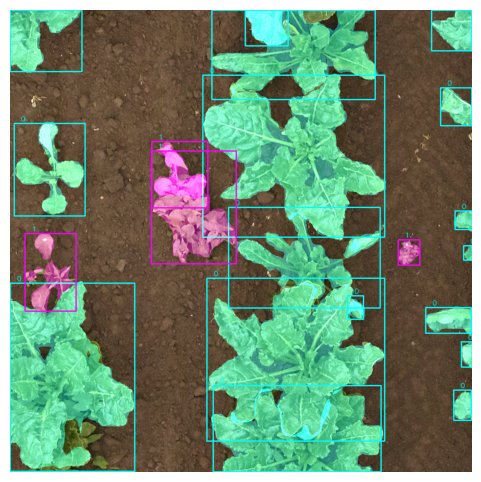

In [4]:
from mmdet.apis import init_detector, inference_detector
import mmcv
import cv2
import matplotlib.pyplot as plt
import torch
import numpy as np

# Class labels
CLASS_LABELS = ["0", "1"]

PRED_COLORS = {0: (255, 255, 0),  # Cyan (Crop)
               1: (255, 0, 255)}  # Magenta (Weed)

# Config and checkpoint paths
config_file = 'mmdetection/configs/condinst/condinst_pheno.py'
checkpoint_file = 'mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.pth'

# Initialize the model
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or 'cpu'

def draw_bbox_with_label(img, bbox, label, color=(0, 0, 255), thickness=2):
    xmin, ymin, xmax, ymax = map(int, bbox)
    # Draw rectangle
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, thickness)
    # Put label text
    cv2.putText(
        img, label, (xmin + 15, ymin - 5),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 1, cv2.LINE_AA
    )

# Image path
img_path = '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png'
img = cv2.imread(img_path)
if img is None:
    raise Exception("Image not found or unreadable")

# Run inference
results = inference_detector(model, img_path)

# Access the prediction results from the DetDataSample object
pred_instances = results.pred_instances

CONF_THRESHOLD = 0.3
img_with_masks = img.copy()

# Draw boxes and labels
# pred_instances.bboxes, pred_instances.scores, and pred_instances.labels are tensors
for i in range(len(pred_instances.bboxes)):
    score = pred_instances.scores[i]
    if score < CONF_THRESHOLD:
        continue

    # 1. Get Class and Color
    label_id = pred_instances.labels[i].item()
    class_name = CLASS_LABELS[label_id]
    color = PRED_COLORS[label_id]

    # 2. Extract and Process Mask
    # pred_instances.masks is a boolean tensor of shape (N, H, W)
    mask = pred_instances.masks[i].cpu().numpy()

    # Create a colored version of the mask
    colored_mask = np.zeros_like(img, dtype=np.uint8)
    colored_mask[mask] = color

    # 3. Overlay Mask onto Image (Alpha Blending)
    alpha = 0.4  # Transparency level
    img_with_masks = cv2.addWeighted(img_with_masks, 1.0, colored_mask, alpha, 0)

    # 4. Draw Bounding Box and Label
    bbox = pred_instances.bboxes[i].tolist()
    draw_bbox_with_label(img_with_masks, bbox, class_name, color=color)

# Show result
img_with_bbox_rgb = cv2.cvtColor(img_with_masks, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6, 6))
plt.axis('off')
plt.imshow(img_with_bbox_rgb)
plt.show()

In [5]:
!pip install onnx onnxscript

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 80.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 50.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 92.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.3/159.3 kB 17.5 MB/s eta 0:00:00
  Attempting uninstall: ml_dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
tensorflow 2.18.0 requires ml-dtypes<0.5.0,>=0.4.0, but you have ml-dtypes 0.5.4 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.24.4

In [6]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

cuda


In [28]:
import torch
import torch.nn as nn

class CondInstONNXWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        feats = self.model.extract_feat(x)

        # detection outputs
        det_outs = self.model.bbox_head(feats)

        # correct mask feature extraction
        mask_feats = self.model.mask_head.mask_feature_head(feats)

        return (*det_outs, mask_feats)

In [29]:
wrapper = CondInstONNXWrapper(model).to(device).eval()
dummy_input = torch.randn(1, 3, 512, 512).to(device)
onnx_model_path = "mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.onnx"
torch.onnx.export(
    wrapper,
    dummy_input,
    onnx_model_path,
    opset_version=13,
    input_names=["input"],
    output_names=["boxes", "labels", "scores"],
    dynamic_axes={
        "input": {0: "batch_size", 2: "height", 3: "width"},
        "boxes": {0: "num_boxes"},
        "labels": {0: "num_boxes"},
        "scores": {0: "num_boxes"},
    },
    do_constant_folding=True,
)
print(f"ONNX export {onnx_model_path} completed successfully!")

/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet/models/dense_heads/condinst_head.py:827: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert factor_h == factor_w
/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet/models/utils/misc.py:612: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert factor >= 1
/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet/models/utils/misc.py:613: TracerWarning: Converting a tensor to a Python integer might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be 

============= Diagnostic Run torch.onnx.export version 2.0.1+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================

ONNX export mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.onnx completed successfully!


In [21]:
!pip install onnxruntime-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.6/252.6 MB 7.5 MB/s eta 0:00:00


In [67]:
import onnxruntime
import numpy as np
import cv2
import torch
import os
import random

# Load image and preprocess
img_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png"

mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

img = cv2.imread(img_path)
img_resized = cv2.resize(img, (512, 512))
img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

# Run inference
session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name
outputs = session.run(None, {input_name: img_input})

# outputs is a list, often like [boxes, scores, keypoints]
print("Output:", [o.shape for o in outputs])

Output: [(1, 2, 64, 64), (1, 2, 32, 32), (1, 2, 16, 16), (1, 2, 8, 8), (1, 2, 4, 4), (1, 4, 64, 64), (1, 4, 32, 32), (1, 4, 16, 16), (1, 4, 8, 8), (1, 4, 4, 4), (1, 1, 64, 64), (1, 1, 32, 32), (1, 1, 16, 16), (1, 1, 8, 8), (1, 1, 4, 4), (1, 169, 64, 64), (1, 169, 32, 32), (1, 169, 16, 16), (1, 169, 8, 8), (1, 169, 4, 4), (1, 8, 64, 64)]


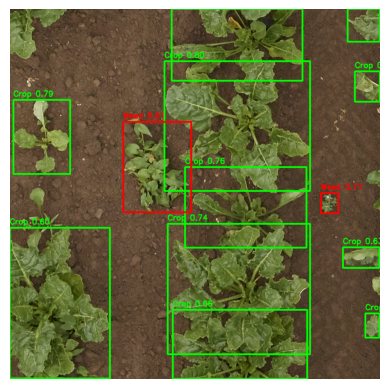

In [74]:
import numpy as np
import torch
from torchvision.ops import nms
import cv2
from matplotlib import pyplot as plt

# ---------------- CONFIG ----------------
STRIDES = [8, 16, 32, 64, 128]
NUM_CLASSES = 2
CONF_THR = 0.6
IOU_THR = 0.3

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def generate_grid(h, w, stride):
    shifts_x = (np.arange(w) + 0.5) * stride
    shifts_y = (np.arange(h) + 0.5) * stride
    xv, yv = np.meshgrid(shifts_x, shifts_y)
    return np.stack([xv, yv], axis=-1).reshape(-1, 2)  # (H*W, 2)

# ---------------------------------------
all_boxes = []
all_scores = []
all_labels = []

for lvl, stride in enumerate(STRIDES):

    cls_map = outputs[lvl][0]          # (C,H,W)
    reg_map = outputs[lvl + 5][0]      # (4,H,W)
    ctr_map = outputs[lvl + 10][0]     # (1,H,W)

    C, H, W = cls_map.shape

    # 1. Apply sigmoid
    cls_scores = sigmoid(cls_map).reshape(C, -1).T     # (H*W, C)
    ctr_scores = sigmoid(ctr_map).reshape(-1, 1)       # (H*W,1)

    # 2. Final scores
    scores_all = cls_scores * ctr_scores               # (H*W, C)

    # 3. Get best class per location
    labels = np.argmax(scores_all, axis=1)
    scores = scores_all[np.arange(len(labels)), labels]

    # 4. Threshold early (speedup)
    mask = scores > 0.05
    if not np.any(mask):
        continue

    scores = scores[mask]
    labels = labels[mask]

    # 5. Decode boxes
    reg = reg_map.reshape(4, -1).T[mask]               # (N,4)

    points = generate_grid(H, W, stride)[mask]

    x1 = points[:, 0] - reg[:, 0]
    y1 = points[:, 1] - reg[:, 1]
    x2 = points[:, 0] + reg[:, 2]
    y2 = points[:, 1] + reg[:, 3]

    boxes = np.stack([x1, y1, x2, y2], axis=1)

    all_boxes.append(boxes)
    all_scores.append(scores)
    all_labels.append(labels)

# ---------------- NMS ----------------
if len(all_boxes) == 0:
    print("No detections")
else:
    boxes = np.concatenate(all_boxes, axis=0)
    scores = np.concatenate(all_scores, axis=0)
    labels = np.concatenate(all_labels, axis=0)

    # multiclass NMS trick
    offsets = labels.astype(np.float32) * 4096
    boxes_for_nms = boxes + offsets[:, None]

    keep = nms(
        torch.tensor(boxes_for_nms).float(),
        torch.tensor(scores).float(),
        IOU_THR
    ).numpy()

    # --------------- VISUALIZE ----------------
    img_vis = img.copy()

    h_orig, w_orig = img.shape[:2]
    rx, ry = w_orig / 512, h_orig / 512

    for idx in keep:
        if scores[idx] < CONF_THR:
            continue

        x1, y1, x2, y2 = boxes[idx]

        # rescale to original image
        x1, x2 = x1 * rx, x2 * rx
        y1, y2 = y1 * ry, y2 * ry

        b = [int(x1), int(y1), int(x2), int(y2)]

        color = (0,255,0) if labels[idx]==0 else (0,0,255)

        cv2.rectangle(img_vis, (b[0],b[1]), (b[2],b[3]), color, 3)
        label_text = f"{'Crop' if labels[idx]==0 else 'Weed'} {scores[idx]:.2f}"
        cv2.putText(img_vis, label_text, (b[0],b[1]-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

    plt.imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

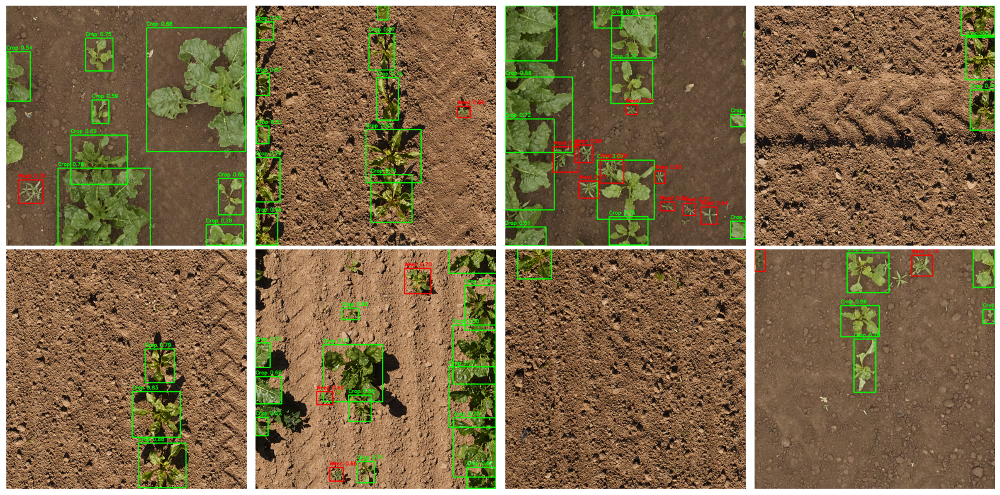

In [76]:
mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name

STRIDES = [8, 16, 32, 64, 128]
NUM_CLASSES = 2
CONF_THR = 0.5
IOU_THR = 0.3

# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/"

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)
    img_resized = cv2.resize(img, (512, 512))
    img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs = session.run(None, {input_name: img_input})

    all_boxes = []
    all_scores = []
    all_labels = []

    for lvl, stride in enumerate(STRIDES):

        cls_map = outputs[lvl][0]          # (C,H,W)
        reg_map = outputs[lvl + 5][0]      # (4,H,W)
        ctr_map = outputs[lvl + 10][0]     # (1,H,W)

        C, H, W = cls_map.shape

        # 1. Apply sigmoid
        cls_scores = sigmoid(cls_map).reshape(C, -1).T     # (H*W, C)
        ctr_scores = sigmoid(ctr_map).reshape(-1, 1)       # (H*W,1)

        # 2. Final scores
        scores_all = cls_scores * ctr_scores               # (H*W, C)

        # 3. Get best class per location
        labels = np.argmax(scores_all, axis=1)
        scores = scores_all[np.arange(len(labels)), labels]

        # 4. Threshold early (speedup)
        mask = scores > 0.05
        if not np.any(mask):
            continue

        scores = scores[mask]
        labels = labels[mask]

        # 5. Decode boxes
        reg = reg_map.reshape(4, -1).T[mask]               # (N,4)

        points = generate_grid(H, W, stride)[mask]

        x1 = points[:, 0] - reg[:, 0]
        y1 = points[:, 1] - reg[:, 1]
        x2 = points[:, 0] + reg[:, 2]
        y2 = points[:, 1] + reg[:, 3]

        boxes = np.stack([x1, y1, x2, y2], axis=1)

        all_boxes.append(boxes)
        all_scores.append(scores)
        all_labels.append(labels)

    # ---------------- NMS ----------------
    if len(all_boxes) == 0:
        print("No detections")
    else:
        boxes = np.concatenate(all_boxes, axis=0)
        scores = np.concatenate(all_scores, axis=0)
        labels = np.concatenate(all_labels, axis=0)

        # multiclass NMS trick
        offsets = labels.astype(np.float32) * 4096
        boxes_for_nms = boxes + offsets[:, None]

        keep = nms(
            torch.tensor(boxes_for_nms).float(),
            torch.tensor(scores).float(),
            IOU_THR
        ).numpy()

        # --------------- VISUALIZE ----------------
        img_vis = img.copy()

        h_orig, w_orig = img.shape[:2]
        rx, ry = w_orig / 512, h_orig / 512

        for idx in keep:
            if scores[idx] < CONF_THR:
                continue

            x1, y1, x2, y2 = boxes[idx]

            # rescale to original image
            x1, x2 = x1 * rx, x2 * rx
            y1, y2 = y1 * ry, y2 * ry

            b = [int(x1), int(y1), int(x2), int(y2)]

            color = (0,255,0) if labels[idx]==0 else (0,0,255)

            cv2.rectangle(img_vis, (b[0],b[1]), (b[2],b[3]), color, 3)
            label_text = f"{'Crop' if labels[idx]==0 else 'Weed'} {scores[idx]:.2f}"
            cv2.putText(img_vis, label_text, (b[0],b[1]-10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()